# Emotion detection (by zerrad nizar)

This notebook provides the main steps that have been followed to build an AI model that detects human emotions. I have tried to be as precise as possible in the explanations. If you find something inaccurate, please feel free to contact me on LinkedIn (linkedin.com/in/nizar-zerrad-3b6023246/) or github (github.com/nizar-zerrad) to discuss it. Good reading!

# import libraries

In [1]:
import numpy as np
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy,TopKCategoricalAccuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import (RandomContrast, Rescaling, Resizing, Reshape,RandomZoom,RandomBrightness,GlobalAveragePooling2D, Activation, MaxPooling2D, Add, Conv2D, MaxPool2D, Dense,
                                     Flatten, InputLayer, BatchNormalization, Input, Embedding, Permute,
                                     RandomRotation, LayerNormalization,Dropout, RandomFlip
                                      )
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import InputLayer, Conv2D, BatchNormalization, MaxPool2D, Dropout, Dense, Flatten
from tensorflow.keras.regularizers  import L2, L1
from sklearn.metrics import confusion_matrix
import seaborn as sns
import cv2
from tensorflow.keras.models import Model

# Preparing data

### Data downloading

the train and test data used in this model are in the kaggle dataset: https://www.kaggle.com/datasets/muhammadhananasghar/human-emotions-datasethes

thanks: MUHAMMAD HANAN ASGHAR

This cell is for installing the data directly from the Kaggle website. Don't forget to add 'kaggle.json' (the API key) to the location ~/.kaggle/kaggle.json.

Alternatively, you can also perform this task manually.

In [ ]:
!pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d muhammadhananasghar/human-emotions-datasethes
!unzip "/content/human-emotions-datasethes.zip" -d "/content/dataset/"

In [3]:
train_directory="dataset/Emotions Dataset/Emotions Dataset/train"
test_directory="dataset/Emotions Dataset/Emotions Dataset/test"

### data labeling

creates a labeled image dataset from train/test directory

In [4]:
train=tf.keras.utils.image_dataset_from_directory(
    train_directory,
    labels='inferred',
    label_mode='categorical',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False,
)

Found 6799 files belonging to 3 classes.


In [5]:
val=tf.keras.utils.image_dataset_from_directory(
    test_directory,
    labels='inferred',
    label_mode='categorical',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False,
)

Found 2278 files belonging to 3 classes.


### Data visualisation

visualisation some images with labels

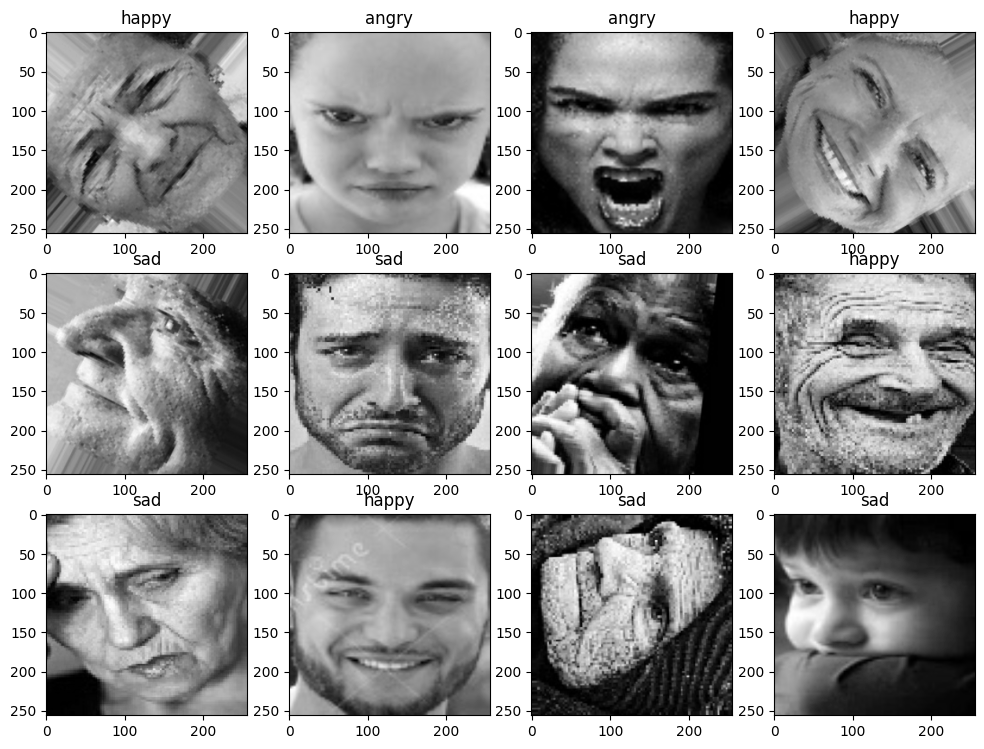

In [ ]:

CLASS=['angry','happy','sad']
plt.figure(figsize=(12,12))
for image, label in val.take(2):
    for i in range(12):
        ax=plt.subplot(4,4,i+1)
        plt.imshow(image[i]/255,cmap='gray')
        plt.title(CLASS[tf.argmax(label[i])])

# Data augmentation

Create a Sequential model for data augmentation

In [6]:
augment_layers = tf.keras.Sequential([
    # Randomly rotate the images by a factor between -0.075 and 0.075
    RandomRotation(factor=(-0.075, 0.075)),
    # Randomly flip the images horizontally
    RandomFlip(mode='horizontal'),
    # Randomly adjust the contrast of the images by a factor between -0.3 and 0.3
    RandomContrast(factor=0.3),
    # Randomly zoom into the images by a factor between 0 and 0.35
    RandomZoom(height_factor=[0, 0.35]),
    # Randomly adjust the brightness of the images by a factor between -0.2 and 0.2
    RandomBrightness(factor=[-0.2, 0.2])
])

def augment_layer(image, label):
  return augment_layers(image, training = True), label

multiply the train data by (num_mul+1)

In [7]:

num_mul=3
augmented_train_dataset= train
for _ in range(num_mul):
    augmented_train_dataset = augmented_train_dataset.concatenate(train.map(lambda x, y: (augment_layers(x, training=True), y)))

prefetching data

In [8]:
train_data=(augmented_train_dataset.prefetch(tf.data.AUTOTUNE))
val_data=(val.prefetch(tf.data.AUTOTUNE))

# First model from scratch: Lenet model

In [4]:
#variables
IM_SIZE = 256
DROPOUT_RATE = 0
REGULARIZATION_RATE = 0
N_FILTERS = 6
KERNEL_SIZE = 3
POOL_SIZE = 2
N_STRIDES = 1
N_DENSE_1 = 100
N_DENSE_2 = 10
LEARNING_RATE = 0.001
EPOCHS = 20
NUM_CLASSES=3
CLASS_NAMES = ["angry", "happy", "sad"]

### Grid Search

The choice of some of these variables was determined using a grid search, and the optimal values are now stored in these variables.

### Lenet model

In [ ]:
model = tf.keras.Sequential([
    InputLayer(input_shape = (IM_SIZE, IM_SIZE, 3)),
    Resizing(IM_SIZE, IM_SIZE),
    Rescaling(1./255),
    Conv2D(filters = N_FILTERS , kernel_size = KERNEL_SIZE, strides = N_STRIDES , padding='valid',
          activation = 'relu',kernel_regularizer = L2(REGULARIZATION_RATE)),
    BatchNormalization(),
    MaxPool2D (pool_size = POOL_SIZE, strides= N_STRIDES*2),
    Dropout(rate = DROPOUT_RATE ),

    Conv2D(filters = N_FILTERS*2 + 4, kernel_size = KERNEL_SIZE, strides=N_STRIDES, padding='valid',
          activation = 'relu', kernel_regularizer = L2(REGULARIZATION_RATE)),
    BatchNormalization(),
    MaxPool2D (pool_size = POOL_SIZE, strides= N_STRIDES*2),

    Flatten(),

    Dense( N_DENSE_1, activation = "relu", kernel_regularizer = L2(REGULARIZATION_RATE)),
    BatchNormalization(),
    Dropout(rate = DROPOUT_RATE),

    Dense( N_DENSE_2, activation = "relu", kernel_regularizer = L2(REGULARIZATION_RATE)),
    BatchNormalization(),

    Dense(NUM_CLASSES, activation = "softmax"),

])

model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 256, 256, 1)       0         
                                                                 
 rescaling (Rescaling)       (None, 256, 256, 1)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 6)       60        
                                                                 
 batch_normalization (Batch  (None, 254, 254, 6)       24        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 6)       0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 127, 127, 6)     

### model training

In [ ]:
loss=CategoricalCrossentropy()
metrics=[CategoricalAccuracy(),TopKCategoricalAccuracy(k=2,name='Top_K_Accuracy')]
optimizer=Adam(learning_rate=LEARNING_RATE)

model.compile(
    optimizer=optimizer,
    loss=loss,
    metrics=metrics
)

In [ ]:
checkpoint_callback = ModelCheckpoint(
    filepath='best_model.h5',
    monitor='val_categorical_accuracy',
    mode = 'max',
    verbose=1,
    save_best_only=True,

    )

In [ ]:
history=model.fit(train_data,validation_data=val_data,epochs=EPOCHS,verbose=1,callbacks=checkpoint_callback)

Epoch 1/20

852/852 [==============================] - ETA: 0s - loss: 0.8884 - categorical_accuracy: 0.5898 - Top_K_Accuracy: 0.8431
Epoch 1: val_categorical_accuracy improved from -inf to 0.57155, saving model to best_model.h5


C:\Users\DELL\anaconda310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


852/852 [==============================] - 762s 888ms/step - loss: 0.8884 - categorical_accuracy: 0.5898 - Top_K_Accuracy: 0.8431 - val_loss: 0.9053 - val_categorical_accuracy: 0.5716 - val_Top_K_Accuracy: 0.8297
Epoch 2/20
852/852 [==============================] - ETA: 0s - loss: 0.7447 - categorical_accuracy: 0.6676 - Top_K_Accuracy: 0.8898
Epoch 2: val_categorical_accuracy improved from 0.57155 to 0.65759, saving model to best_model.h5
852/852 [==============================] - 647s 759ms/step - loss: 0.7447 - categorical_accuracy: 0.6676 - Top_K_Accuracy: 0.8898 - val_loss: 0.7644 - val_categorical_accuracy: 0.6576 - val_Top_K_Accuracy: 0.8911
Epoch 3/20
852/852 [==============================] - ETA: 0s - loss: 0.6525 - categorical_accuracy: 0.7200 - Top_K_Accuracy: 0.9118
Epoch 3: val_categorical_accuracy improved from 0.65759 to 0.67428, saving model to best_model.h5
852/852 [==============================] - 718s 842ms/step - loss: 0.6525 - categorical_accuracy: 0.7200 - Top_K

### model performance

plot the losses

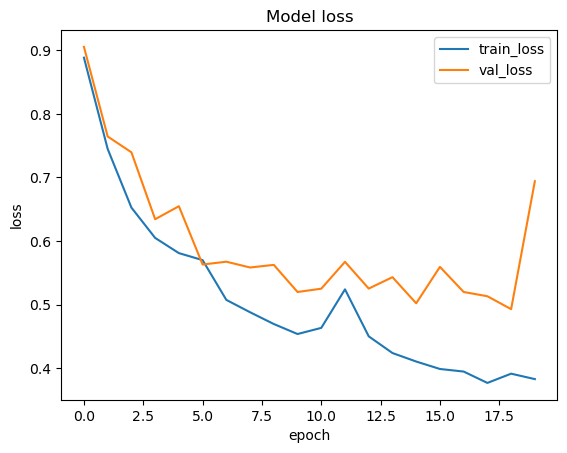

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'])
plt.show()

plot the accuracy

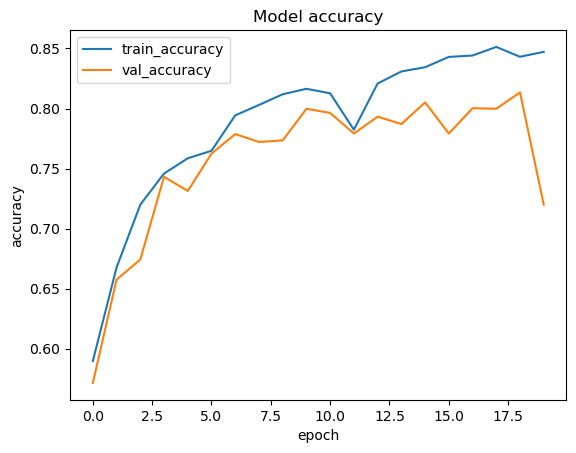

In [ ]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

While this model remains effective with a test accuracy of approximately 81 percent, the visualizations reveal some bias, as the training accuracy is about 85 percent. The next step involves constructing a more complex model. However, due to limitations in computational capacity, I will employ transfer learning to save calculation time.

# Transfer Learning with EfficientNet

### The model

In [11]:
backbone = tf.keras.applications.efficientnet.EfficientNetB4(
    include_top = False,
    weights='imagenet',
    input_shape=(IM_SIZE, IM_SIZE, 3),
    )
backbone.trainable = False
TL_model = tf.keras.Sequential([
    Input(shape = (IM_SIZE, IM_SIZE,3)),
    #resize_rescale_layers,
    backbone,
    GlobalAveragePooling2D(),
    Dense( N_DENSE_1, activation = "relu"),
    BatchNormalization(),
    Dense( N_DENSE_2, activation = "relu"),
    Dense( NUM_CLASSES, activation = "softmax"),

    ])
TL_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb4 (Functional  (None, 8, 8, 1792)        17673823  
 )                                                               
                                                                 
 global_average_pooling2d_1  (None, 1792)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_3 (Dense)             (None, 100)               179300    
                                                                 
 batch_normalization_1 (Bat  (None, 100)               400       
 chNormalization)                                                
                                                                 
 dense_4 (Dense)             (None, 10)                1010      
                                                      

### Training the model

In [12]:


loss=CategoricalCrossentropy()
metrics=[CategoricalAccuracy(),TopKCategoricalAccuracy(k=2,name='Top_K_Accuracy')]
optimizer=Adam(learning_rate=LEARNING_RATE)


In [13]:


TL_model.compile(
    optimizer=optimizer,
    loss=loss,
    metrics=metrics
)

In [14]:
checkpoint_callback = ModelCheckpoint(
    filepath='best_model.h5',
    monitor='val_categorical_accuracy',
    mode = 'max',
    verbose=1,
    save_best_only=True,

    )

In [16]:
history=TL_model.fit(augmented_train_dataset,validation_data=val_data,epochs=EPOCHS+5,verbose=1,callbacks=checkpoint_callback)

Epoch 1/25
852/852 [==============================] - ETA: 0s - loss: 0.5181 - categorical_accuracy: 0.7804 - Top_K_Accuracy: 0.9386
Epoch 1: val_categorical_accuracy improved from 0.77349 to 0.78665, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


852/852 [==============================] - 387s 454ms/step - loss: 0.5181 - categorical_accuracy: 0.7804 - Top_K_Accuracy: 0.9386 - val_loss: 0.5155 - val_categorical_accuracy: 0.7867 - val_Top_K_Accuracy: 0.9372
Epoch 2/25
852/852 [==============================] - ETA: 0s - loss: 0.5009 - categorical_accuracy: 0.7908 - Top_K_Accuracy: 0.9422
Epoch 2: val_categorical_accuracy improved from 0.78665 to 0.79104, saving model to best_model.h5
852/852 [==============================] - 386s 453ms/step - loss: 0.5009 - categorical_accuracy: 0.7908 - Top_K_Accuracy: 0.9422 - val_loss: 0.5206 - val_categorical_accuracy: 0.7910 - val_Top_K_Accuracy: 0.9271
Epoch 3/25
852/852 [==============================] - ETA: 0s - loss: 0.4822 - categorical_accuracy: 0.8027 - Top_K_Accuracy: 0.9465
Epoch 3: val_categorical_accuracy did not improve from 0.79104
852/852 [==============================] - 395s 464ms/step - loss: 0.4822 - categorical_accuracy: 0.8027 - Top_K_Accuracy: 0.9465 - val_loss: 0.515

In [21]:
TL_model.evaluate(val)

72/72 [==============================] - 13s 180ms/step - loss: 0.4386 - categorical_accuracy: 0.8424 - Top_K_Accuracy: 0.9522


[0.4386409521102905, 0.8424056172370911, 0.9521510004997253]

# General information about the model

### Overfitting/Underfitting

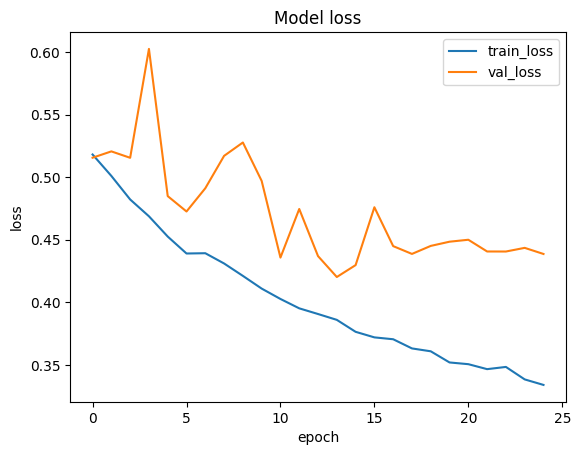

In [18]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss', 'val_loss'])
plt.show()

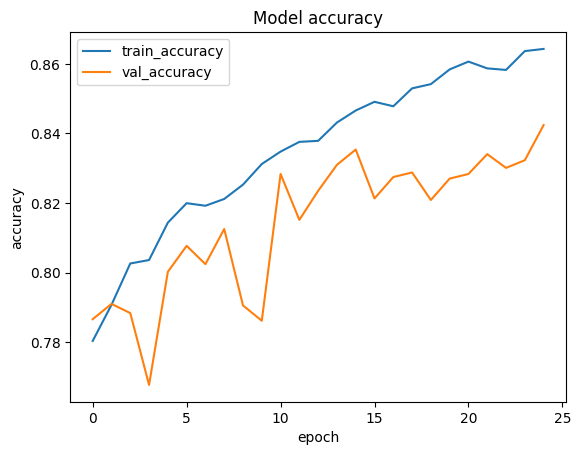

In [20]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train_accuracy', 'val_accuracy'])
plt.show()

The accuracy of this model is better than the previous one, and there is no overfitting since there is no significant difference between the test and train accuracy. There is still a bias in the model, but in my opinion, it is due to the data used to train the model.

### testing

testing the model on a small set

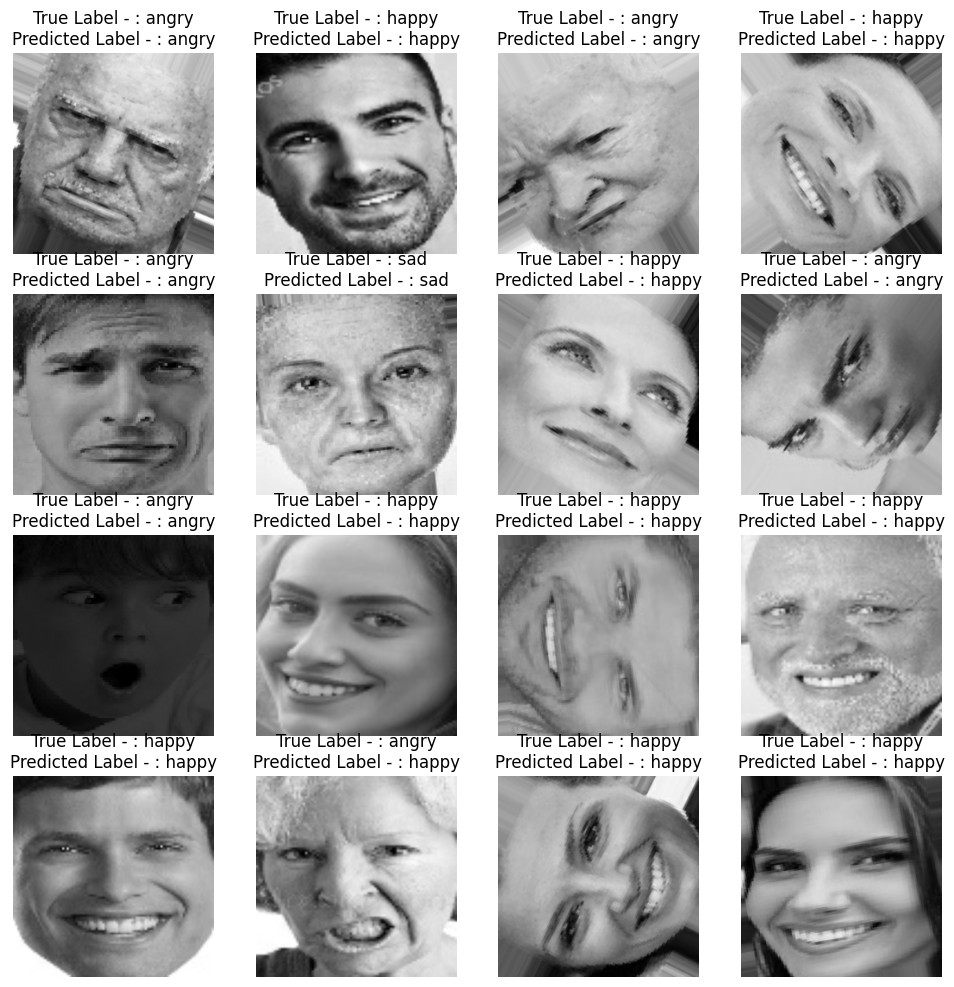

In [26]:
plt.figure(figsize = (12,12))

for images, labels in val.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[i]/255.)

    plt.title("True Label - : " + CLASS_NAMES[tf.argmax(labels[i], axis = -1).numpy()]
              + "\n" + "Predicted Label - : "
              + CLASS_NAMES[int(tf.argmax(TL_model(tf.expand_dims(images[i], axis = 0)), axis =-1).numpy()[0])] )
    plt.axis("off")

One prediction is mismatched because of the unusual shape of the mouth

### Confusion matrix

plot the confusion matrix

In [29]:
predicted = []
labels = []

for im, label in val:
  predicted.append(TL_model(im))
  labels.append(label.numpy())

pred = np.concatenate([np.argmax(predicted[:-1], axis = -1).flatten(), np.argmax(predicted[-1], axis = -1).flatten()])
lab = np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(labels[-1], axis = -1).flatten()])

[[342  77  96]
 [ 15 922  69]
 [ 30  72 655]]


Text(0.5, 58.7222222222222, 'Predicted')

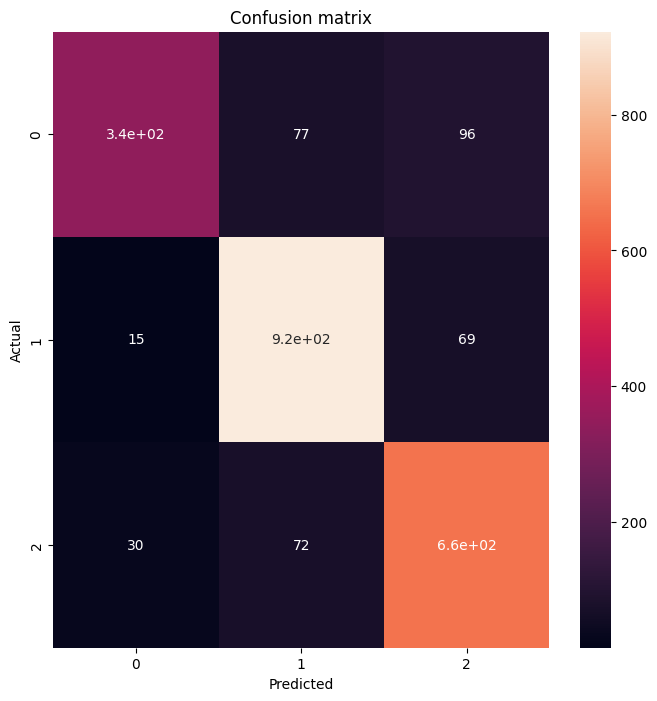

In [33]:
cm = confusion_matrix(lab, pred)
print(cm)
plt.figure(figsize=(8,8))

sns.heatmap(cm, annot=True,)
plt.title('Confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

The confusion matrix shows that, in general, the model didn't find some emotions harder than others. However, the largest confusion in this matrix is with angry individuals being predicted as sad, as it can be challenging at times to discern the difference.

### Feature Map Visualization

This part shows the main changes that the model has made to the photo before the prediction


creat a function to eliminate non conv layers

In [7]:
def is_conv(layer_name):
  if 'conv' in layer_name:
    return True
  else:
    return False

take all the conv layers

In [8]:
feature_maps = [layer.output for layer in backbone.layers[1:] if is_conv(layer.name)]
feature_map_model = Model(
    inputs = backbone.input,
    outputs = feature_maps
)


In [9]:
test_image = cv2.imread("image.jpg")
test_image = cv2.resize(test_image, (IM_SIZE, IM_SIZE))

im = tf.constant(test_image, dtype = tf.float32)
im = tf.expand_dims(im, axis = 0)

f_maps =feature_map_model.predict(im)

1/1 [==============================] - 11s 11s/step


plot the changes

C:\Users\DELL\AppData\Local\Temp\ipykernel_12060\3024106733.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (256,256))


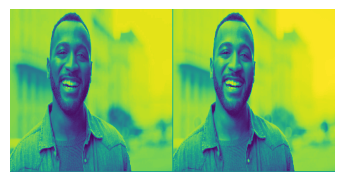

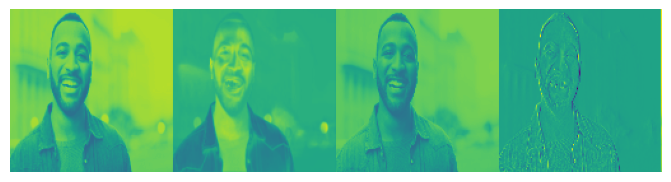

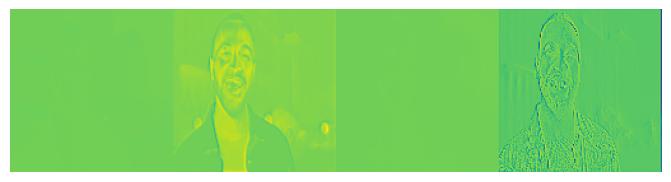

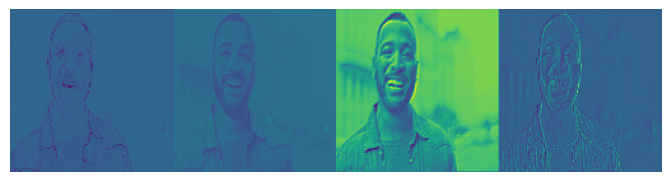

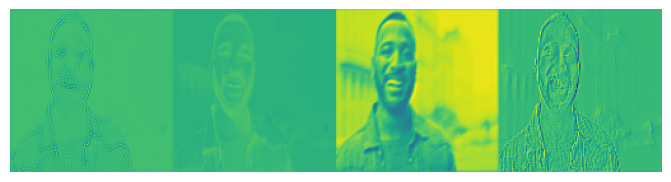

...

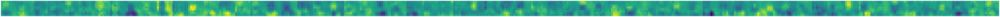

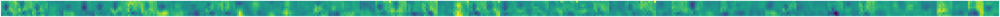

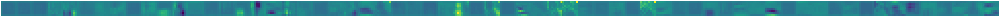

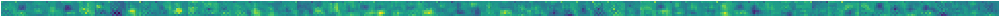

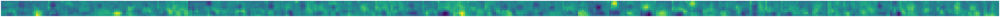

In [11]:
for i in range(len(f_maps)):
    plt.figure(figsize = (256,256))
    f_size= f_maps[i].shape[1]
    n_channels= f_maps[i].shape[3]
    joint_maps= np.ones((f_size, f_size*n_channels ))
    axs= plt.subplot(len(f_maps), 1, i+1)
    
    for j in range(n_channels):
    joint_maps[:, f_size*j:f_size*(j+1)] = f_maps[i][..., j]
    
    plt.imshow(joint_maps[:,0:512])
    plt.axis("off")

We can observe that as we delve deeper into the model, it begins to give more consideration to the edges.

# Conclusion

To conclude, the final model employed is an EfficientNet with an accuracy of nearly 85%. This model is named 'best_model.h5' in the project, and it will be utilized in app.py. Thank you for reading.